# Oracle GT-Mask Ablation

This notebook tests whether replacing Follow-Your-Shape's estimated mask with the PartEdit ground-truth part mask improves the final edit under the same inversion, target trajectory, and late KV-injection schedule.

The Oracle mask is a GT-conditioned control upper bound, not a localization estimator. Its localization agreement is validated by construction; edited-image preservation and semantic edit success are the substantive outcomes.

## 1. Scope

The comparison contains Original FYS-TDM, part+edit attention gating, part-only attention gating, and Oracle GT-mask FYS. The first three methods have 36 command runs but 12 unique deterministic outputs. Oracle has 12 seed-0 command runs and 12 unique outputs. Repeated seed rows are not independent samples.

In [1]:
from __future__ import annotations

import json
import math
from pathlib import Path

import numpy as np
import pandas as pd
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

try:
    import torch
    import lpips
    HAS_LPIPS = True
except Exception:
    torch = None
    lpips = None
    HAS_LPIPS = False

pd.set_option("display.max_columns", 120)
pd.set_option("display.width", 180)

REPO_ROOT = Path.cwd()
while not (REPO_ROOT / "pyproject.toml").exists():
    if REPO_ROOT.parent == REPO_ROOT:
        raise RuntimeError("Could not find repository root")
    REPO_ROOT = REPO_ROOT.parent

DATA_ROOT = REPO_ROOT / "core/data/partedit_subset"
RESULT_ROOT = REPO_ROOT / "core/results"
PRIOR_EVAL_DIR = RESULT_ROOT / "attention_gated_fys_eval"
ORACLE_ROOT = RESULT_ROOT / "fys_mask_ablation/oracle_gt_mask"
OUTPUT_DIR = RESULT_ROOT / "oracle_mask_eval"
FIGURE_DIR = OUTPUT_DIR / "figures"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

manifest = json.loads((DATA_ROOT / "pilot_12_manifest.json").read_text())
cases = pd.DataFrame(manifest)
print("repo:", REPO_ROOT)
print("Oracle cases:", len(cases))
print("LPIPS available:", HAS_LPIPS)

repo: /Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting
Oracle cases: 12
LPIPS available: False


## 2. Validate Inputs

In [2]:
required = [
    "img_0.jpg", "run.log", "run_config.json", "tdm/tdm_metadata.json",
    "tdm/selected_injection_mask.npy", "tdm/oracle_gt_mask_patch_grid.npy",
]
rows = []
for case in manifest:
    run_dir = ORACLE_ROOT / case["case_uid"] / "seed_000"
    missing = [name for name in required if not (run_dir / name).exists()]
    if missing:
        raise FileNotFoundError(f"{case['case_uid']}: missing {missing}")
    rows.append({
        **case,
        "run_uid": f"{case['case_uid']}_seed_000",
        "seed": 0,
        "run_dir": run_dir.relative_to(REPO_ROOT).as_posix(),
        "image_path": (run_dir / "img_0.jpg").relative_to(REPO_ROOT).as_posix(),
        "selected_mask_path": (run_dir / "tdm/selected_injection_mask.npy").relative_to(REPO_ROOT).as_posix(),
        "oracle_mask_path": (run_dir / "tdm/oracle_gt_mask_patch_grid.npy").relative_to(REPO_ROOT).as_posix(),
    })
oracle_runs = pd.DataFrame(rows)
print("complete Oracle runs:", len(oracle_runs))
oracle_runs[["case_uid", "part_size", "part", "edit", "image_path"]]

complete Oracle runs: 12


,case_uid,part_size,part,edit,image_path
0,real_0006,small,head,alien,core/results/fys_mask_ablation/oracle_gt_mask/...
1,real_0008,small,head,bear,core/results/fys_mask_ablation/oracle_gt_mask/...
2,real_0003,small,head,cheetah,core/results/fys_mask_ablation/oracle_gt_mask/...
3,real_0002,small,seat,mesh,core/results/fys_mask_ablation/oracle_gt_mask/...
4,real_0010,medium,head,dragon,core/results/fys_mask_ablation/oracle_gt_mask/...
5,real_0004,medium,carhood,rusted,core/results/fys_mask_ablation/oracle_gt_mask/...
6,real_0007,medium,seat,leather,core/results/fys_mask_ablation/oracle_gt_mask/...
7,real_0001,medium,head,cat,core/results/fys_mask_ablation/oracle_gt_mask/...
8,real_0000,large,torso,armored,core/results/fys_mask_ablation/oracle_gt_mask/...
9,real_0011,large,hair,curly_hair,core/results/fys_mask_ablation/oracle_gt_mask/...


## 3. Metric Helpers

In [3]:
def rp(value):
    path = Path(value)
    return path if path.is_absolute() else REPO_ROOT / path

def load_rgb(path, size=None):
    image = Image.open(rp(path)).convert("RGB")
    if size is not None and image.size != size:
        image = image.resize(size, Image.Resampling.BICUBIC)
    return np.asarray(image).astype(np.float32) / 255.0

def load_mask(path, size=None):
    image = Image.open(rp(path)).convert("L")
    if size is not None and image.size != size:
        image = image.resize(size, Image.Resampling.NEAREST)
    return np.asarray(image) > 0

def masked_l1(a, b, mask):
    return float(np.abs(a[mask] - b[mask]).mean()) if mask.any() else float("nan")

def masked_mse(a, b, mask):
    return float(((a[mask] - b[mask]) ** 2).mean()) if mask.any() else float("nan")

def psnr(mse):
    if not np.isfinite(mse):
        return float("nan")
    return float("inf") if mse <= 1e-12 else float(10 * math.log10(1.0 / mse))

def masked_global_ssim(a, b, mask):
    if mask.sum() < 2:
        return float("nan")
    x = (0.299*a[...,0] + 0.587*a[...,1] + 0.114*a[...,2])[mask]
    y = (0.299*b[...,0] + 0.587*b[...,1] + 0.114*b[...,2])[mask]
    c1, c2 = 0.01**2, 0.03**2
    mx, my = x.mean(), y.mean()
    vx, vy = x.var(), y.var()
    cov = ((x-mx)*(y-my)).mean()
    den = (mx**2 + my**2 + c1) * (vx + vy + c2)
    return float(((2*mx*my+c1)*(2*cov+c2))/den) if den else float("nan")

lpips_model = None
if HAS_LPIPS:
    device = "cuda" if torch.cuda.is_available() else "cpu"
    lpips_model = lpips.LPIPS(net="alex").to(device).eval()
    print("LPIPS device:", device)

def outside_lpips(source, edited, gt_mask):
    if lpips_model is None:
        return float("nan")
    outside = (~gt_mask)[...,None].astype(np.float32)
    neutral = np.full_like(source, 0.5)
    a = source*outside + neutral*(1-outside)
    b = edited*outside + neutral*(1-outside)
    ta = torch.from_numpy(a.transpose(2,0,1)).unsqueeze(0)*2-1
    tb = torch.from_numpy(b.transpose(2,0,1)).unsqueeze(0)*2-1
    device = next(lpips_model.parameters()).device
    with torch.no_grad():
        return float(lpips_model(ta.to(device).float(), tb.to(device).float()).item())

## 4. Verify The Actual Oracle Injection Mask

The check reproduces inference preprocessing: nearest resize to the VAE latent grid, then 2x2 max pooling to the FLUX 32x32 image-token grid.

In [4]:
def project_gt(gt_path, source_path):
    width, height = Image.open(rp(source_path)).size
    height -= height % 16
    width -= width % 16
    gt = load_mask(gt_path).astype(np.float32)
    if torch is not None:
        x = torch.from_numpy(gt)[None,None]
        x = torch.nn.functional.interpolate(x, size=(height//8, width//8), mode="nearest")
        return torch.nn.functional.max_pool2d((x>0).float(), 2, 2)[0,0].numpy().astype(np.uint8)
    out_h, out_w = height // 8, width // 8
    row_idx = np.floor(np.arange(out_h) * gt.shape[0] / out_h).astype(int)
    col_idx = np.floor(np.arange(out_w) * gt.shape[1] / out_w).astype(int)
    x = gt[np.ix_(row_idx, col_idx)] > 0
    return x.reshape(height//16, 2, width//16, 2).max(axis=(1,3)).astype(np.uint8)

checks = []
for _, row in oracle_runs.iterrows():
    expected = project_gt(row["gt_mask"], row["source_image"])
    selected = np.load(rp(row["selected_mask_path"])).astype(np.uint8)
    saved = np.load(rp(row["oracle_mask_path"])).astype(np.uint8)
    checks.append({
        "case_uid": row["case_uid"], "part_size": row["part_size"],
        "part": row["part"], "edit": row["edit"],
        "foreground_patches": int(selected.sum()),
        "patch_area_ratio": float(selected.mean()),
        "selected_equals_projected_gt": np.array_equal(selected, expected),
        "saved_oracle_equals_projected_gt": np.array_equal(saved, expected),
    })
oracle_mask_validation = pd.DataFrame(checks)
oracle_mask_validation.to_csv(OUTPUT_DIR / "oracle_mask_validation.csv", index=False)
if not oracle_mask_validation[["selected_equals_projected_gt", "saved_oracle_equals_projected_gt"]].all().all():
    raise AssertionError("Oracle injection-mask validation failed")
oracle_mask_validation

,case_uid,part_size,part,edit,foreground_patches,patch_area_ratio,selected_equals_projected_gt,saved_oracle_equals_projected_gt
0,real_0006,small,head,alien,11,0.010742,True,True
1,real_0008,small,head,bear,33,0.032227,True,True
2,real_0003,small,head,cheetah,39,0.038086,True,True
3,real_0002,small,seat,mesh,40,0.039062,True,True
4,real_0010,medium,head,dragon,66,0.064453,True,True
5,real_0004,medium,carhood,rusted,65,0.063477,True,True
6,real_0007,medium,seat,leather,68,0.066406,True,True
7,real_0001,medium,head,cat,67,0.065430,True,True
8,real_0000,large,torso,armored,105,0.102539,True,True
9,real_0011,large,hair,curly_hair,122,0.119141,True,True


## 5. Oracle Image Metrics

In [5]:
metric_path = OUTPUT_DIR / "oracle_image_preservation_metrics.csv"
existing_lpips = None
if metric_path.exists():
    previous = pd.read_csv(metric_path)
    if "outside_mask_lpips" in previous:
        existing_lpips = previous[["run_uid", "outside_mask_lpips"]].copy()
        existing_lpips["outside_mask_lpips"] = pd.to_numeric(existing_lpips["outside_mask_lpips"], errors="coerce")

metrics = []
for _, row in oracle_runs.iterrows():
    size = Image.open(rp(row["source_image"])).size
    source = load_rgb(row["source_image"])
    edited = load_rgb(row["image_path"], size)
    gt = load_mask(row["gt_mask"], size)
    outside = ~gt
    out_mse, in_mse = masked_mse(source, edited, outside), masked_mse(source, edited, gt)
    metrics.append({
        "method": "oracle_gt_mask", "method_label": "Oracle GT-mask FYS",
        "run_uid": row["run_uid"], "case_uid": row["case_uid"], "seed": 0,
        "part_size": row["part_size"], "part": row["part"], "edit": row["edit"],
        "outside_mask_l1_aux": masked_l1(source, edited, outside),
        "inside_mask_l1_aux": masked_l1(source, edited, gt),
        "outside_mask_mse": out_mse, "inside_mask_mse": in_mse,
        "outside_mask_psnr": psnr(out_mse), "inside_mask_psnr": psnr(in_mse),
        "outside_mask_global_ssim": masked_global_ssim(source, edited, outside),
        "inside_mask_global_ssim": masked_global_ssim(source, edited, gt),
        "outside_mask_lpips": outside_lpips(source, edited, gt),
        "source_image": row["source_image"], "gt_mask": row["gt_mask"],
        "edited_image": row["image_path"],
    })
oracle_metrics = pd.DataFrame(metrics)
if existing_lpips is not None:
    oracle_metrics = oracle_metrics.merge(existing_lpips, on="run_uid", how="left", suffixes=("", "_old"))
    keep = oracle_metrics["outside_mask_lpips"].isna() & oracle_metrics["outside_mask_lpips_old"].notna()
    oracle_metrics.loc[keep, "outside_mask_lpips"] = oracle_metrics.loc[keep, "outside_mask_lpips_old"]
    oracle_metrics = oracle_metrics.drop(columns="outside_mask_lpips_old")
oracle_metrics.to_csv(metric_path, index=False)
print("Oracle LPIPS values:", int(oracle_metrics["outside_mask_lpips"].notna().sum()))
oracle_metrics.head()

Oracle LPIPS values: 12


,method,method_label,run_uid,case_uid,seed,part_size,part,edit,outside_mask_l1_aux,inside_mask_l1_aux,outside_mask_mse,inside_mask_mse,outside_mask_psnr,inside_mask_psnr,outside_mask_global_ssim,inside_mask_global_ssim,outside_mask_lpips,source_image,gt_mask,edited_image
0,oracle_gt_mask,Oracle GT-mask FYS,real_0006_seed_000,real_0006,0,small,head,alien,0.066879,0.229261,0.010659,0.082396,19.722910,10.840956,0.917915,0.441927,0.164301,core/data/partedit_subset/cases/real_0006/sour...,core/data/partedit_subset/cases/real_0006/gt_m...,core/results/fys_mask_ablation/oracle_gt_mask/...
1,oracle_gt_mask,Oracle GT-mask FYS,real_0008_seed_000,real_0008,0,small,head,bear,0.037189,0.103459,0.004035,0.024643,23.941558,16.083098,0.972082,0.830678,0.109024,core/data/partedit_subset/cases/real_0008/sour...,core/data/partedit_subset/cases/real_0008/gt_m...,core/results/fys_mask_ablation/oracle_gt_mask/...
2,oracle_gt_mask,Oracle GT-mask FYS,real_0003_seed_000,real_0003,0,small,head,cheetah,0.048745,0.085346,0.008773,0.017629,20.568427,17.537756,0.953802,0.873194,0.149502,core/data/partedit_subset/cases/real_0003/sour...,core/data/partedit_subset/cases/real_0003/gt_m...,core/results/fys_mask_ablation/oracle_gt_mask/...
3,oracle_gt_mask,Oracle GT-mask FYS,real_0002_seed_000,real_0002,0,small,seat,mesh,0.032562,0.105590,0.003299,0.017456,24.816068,17.580561,0.982061,0.306027,0.092397,core/data/partedit_subset/cases/real_0002/sour...,core/data/partedit_subset/cases/real_0002/gt_m...,core/results/fys_mask_ablation/oracle_gt_mask/...
4,oracle_gt_mask,Oracle GT-mask FYS,real_0010_seed_000,real_0010,0,medium,head,dragon,0.050068,0.128105,0.005716,0.027370,22.429164,15.627289,0.961022,0.589836,0.148293,core/data/partedit_subset/cases/real_0010/sour...,core/data/partedit_subset/cases/real_0010/gt_m...,core/results/fys_mask_ablation/oracle_gt_mask/...


## 6. Final Four-Method Summary

In [6]:
prior_path = PRIOR_EVAL_DIR / "attention_gated_fys_summary.csv"
if not prior_path.exists():
    raise FileNotFoundError(f"Run notebook 05 first: {prior_path}")
prior = pd.read_csv(prior_path)
prior = prior[prior["method"].isin(["original_fys", "gated_part_edit", "gated_part"])].copy()
prior["command_runs"], prior["unique_outputs"] = 36, 12

oracle = pd.DataFrame([{
    "method": "oracle_gt_mask", "method_label": "Oracle GT-mask FYS", "runs": 12,
    "mean_iou": 1.0, "mean_soft_ap": 1.0, "mean_area_ratio": 1.0,
    "outside_l1_aux": oracle_metrics["outside_mask_l1_aux"].mean(),
    "outside_psnr": oracle_metrics["outside_mask_psnr"].mean(),
    "outside_global_ssim": oracle_metrics["outside_mask_global_ssim"].mean(),
    "outside_lpips": oracle_metrics["outside_mask_lpips"].mean(),
    "inside_l1_aux": oracle_metrics["inside_mask_l1_aux"].mean(),
    "inside_global_ssim": oracle_metrics["inside_mask_global_ssim"].mean(),
    "command_runs": 12, "unique_outputs": 12,
}])
summary = pd.concat([prior, oracle], ignore_index=True, sort=False)
summary["localization_interpretation"] = np.where(
    summary["method"].eq("oracle_gt_mask"),
    "GT-conditioned; IoU/AP/area are fixed by construction",
    "Estimated localization evaluated against GT",
)
columns = [
    "method", "method_label", "command_runs", "unique_outputs",
    "mean_iou", "mean_soft_ap", "mean_area_ratio",
    "outside_l1_aux", "outside_psnr", "outside_global_ssim", "outside_lpips",
    "inside_l1_aux", "inside_global_ssim", "localization_interpretation",
]
summary = summary[columns]
summary.to_csv(OUTPUT_DIR / "oracle_comparison_summary.csv", index=False)
summary.round(3)

,method,method_label,command_runs,unique_outputs,mean_iou,mean_soft_ap,mean_area_ratio,outside_l1_aux,outside_psnr,outside_global_ssim,outside_lpips,inside_l1_aux,inside_global_ssim,localization_interpretation
0,gated_part,Attention-Gated FYS (part-only),36,12,0.323,0.619,2.506,0.046,22.104,0.941,0.142,0.112,0.638,Estimated localization evaluated against GT
1,gated_part_edit,Attention-Gated FYS (part+edit),36,12,0.327,0.591,2.812,0.047,21.786,0.938,0.146,0.114,0.635,Estimated localization evaluated against GT
2,original_fys,Original FYS-TDM,36,12,0.174,0.247,8.042,0.056,20.360,0.919,0.191,0.117,0.614,Estimated localization evaluated against GT
3,oracle_gt_mask,Oracle GT-mask FYS,12,12,1.000,1.000,1.000,0.043,22.952,0.953,0.126,0.118,0.620,GT-conditioned; IoU/AP/area are fixed by const...


## 7. Per-Case Changes Versus Original FYS

In [7]:
prior_images = pd.read_csv(PRIOR_EVAL_DIR / "image_preservation_metrics.csv")
original = prior_images[prior_images["method"]=="original_fys"].sort_values("seed").drop_duplicates("case_uid")
metrics_to_compare = ["outside_mask_l1_aux", "outside_mask_psnr", "outside_mask_global_ssim", "outside_mask_lpips"]
per_case = oracle_metrics.merge(original[["case_uid", *metrics_to_compare]], on="case_uid", suffixes=("_oracle", "_original"))
for name in metrics_to_compare:
    per_case[f"delta_{name}"] = per_case[f"{name}_oracle"] - per_case[f"{name}_original"]
per_case.to_csv(OUTPUT_DIR / "oracle_per_case_deltas.csv", index=False)
per_case[["case_uid","part_size","part","edit",*[f"delta_{x}" for x in metrics_to_compare]]].round(3)

,case_uid,part_size,part,edit,delta_outside_mask_l1_aux,delta_outside_mask_psnr,delta_outside_mask_global_ssim,delta_outside_mask_lpips
0,real_0006,small,head,alien,-0.014,2.114,0.049,-0.064
1,real_0008,small,head,bear,-0.010,2.199,0.018,-0.089
2,real_0003,small,head,cheetah,-0.012,2.156,0.028,-0.059
3,real_0002,small,seat,mesh,-0.014,3.092,0.018,-0.050
4,real_0010,medium,head,dragon,-0.021,3.180,0.039,-0.106
5,real_0004,medium,carhood,rusted,-0.018,3.023,0.063,-0.074
6,real_0007,medium,seat,leather,-0.007,2.556,0.026,-0.025
7,real_0001,medium,head,cat,-0.007,1.826,0.042,-0.044
8,real_0000,large,torso,armored,-0.013,2.788,0.054,-0.083
9,real_0011,large,hair,curly_hair,-0.014,2.690,0.024,-0.074


## 8. Qualitative Comparison

In [8]:
ROOTS = {
    "original": RESULT_ROOT / "follow_your_shape",
    "part_edit": RESULT_ROOT / "fys_mask_ablation/attention_gated_tdm",
    "part": RESULT_ROOT / "fys_mask_ablation/attention_gated_tdm_part",
    "oracle": ORACLE_ROOT,
}

def latest_image(run_dir):
    images = sorted(run_dir.glob("img_*.jpg"), key=lambda x: int(x.stem.split("_")[-1]))
    if not images:
        raise FileNotFoundError(run_dir)
    return images[-1]

def u8(x):
    return np.clip(x*255, 0, 255).astype(np.uint8)

def overlay(image, mask, color=(255,0,0), alpha=.43):
    base = Image.fromarray(u8(image)).convert("RGBA")
    layer = Image.new("RGBA", base.size, (*color,0))
    layer.putalpha(Image.fromarray((mask.astype(np.float32)*255*alpha).astype(np.uint8)))
    return Image.alpha_composite(base, layer).convert("RGB")

def wrap(text, width, font):
    draw = ImageDraw.Draw(Image.new("RGB",(width,10)))
    lines, current = [], ""
    for word in text.split():
        candidate = f"{current} {word}".strip()
        if draw.textbbox((0,0), candidate, font=font)[2] <= width:
            current = candidate
        else:
            if current: lines.append(current)
            current = word
    if current: lines.append(current)
    return lines

def case_panel(case, thumb=(180,180), text_width=300):
    source = load_rgb(case["source_image"])
    size = Image.open(rp(case["source_image"])).size
    gt = load_mask(case["gt_mask"], size)
    panels = [Image.fromarray(u8(source)), overlay(source, gt)]
    labels = ["source", "GT part"]
    for key, label in [("original","original FYS"),("part_edit","gated part+edit"),("part","gated part"),("oracle","Oracle GT-mask")]:
        panels.append(Image.fromarray(u8(load_rgb(latest_image(ROOTS[key]/case["case_uid"]/"seed_000"), size))))
        labels.append(label)
    selected = np.load(ORACLE_ROOT/case["case_uid"]/"seed_000/tdm/selected_injection_mask.npy")
    selected = np.asarray(Image.fromarray((selected*255).astype(np.uint8)).resize(size, Image.Resampling.NEAREST)) > 0
    panels.append(overlay(source, selected, color=(255,215,0)))
    labels.append("actual Oracle mask")
    panels = [x.resize(thumb, Image.Resampling.BICUBIC) for x in panels]
    font = ImageFont.load_default()
    canvas = Image.new("RGB", (text_width+len(panels)*thumb[0], thumb[1]+36), "white")
    draw = ImageDraw.Draw(canvas)
    text = f"{case['case_uid']} | {case['part_size']} | {case['part']} -> {case['edit']}\nTarget: {case['target_prompt']}"
    y = 5
    for line in text.split("\n"):
        for item in wrap(line, text_width-10, font):
            draw.text((5,y), item, fill="black", font=font); y += 14
    x = text_width
    for label, panel in zip(labels, panels):
        draw.text((x+4,5), label, fill="black", font=font)
        canvas.paste(panel,(x,22)); x += thumb[0]
    return canvas

figure_paths = []
for index, start in enumerate(range(0,12,4), 1):
    panels = [case_panel(row) for _,row in cases.iloc[start:start+4].iterrows()]
    sheet = Image.new("RGB",(max(x.width for x in panels),sum(x.height for x in panels)),"white")
    y = 0
    for panel in panels:
        sheet.paste(panel,(0,y)); y += panel.height
    path = FIGURE_DIR / f"oracle_comparison_part{index}.jpg"
    sheet.save(path, quality=95)
    figure_paths.append(path)
figure_paths

[PosixPath('/Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting/core/results/oracle_mask_eval/figures/oracle_comparison_part1.jpg'),
 PosixPath('/Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting/core/results/oracle_mask_eval/figures/oracle_comparison_part2.jpg'),
 PosixPath('/Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting/core/results/oracle_mask_eval/figures/oracle_comparison_part3.jpg')]

### Focused qualitative evidence

The first figure aligns each method's actual injection mask with its output on a relatively successful local material edit. The second uses the cow-road example to isolate the central failure: substantially better localization and preservation do not guarantee the requested semantics.

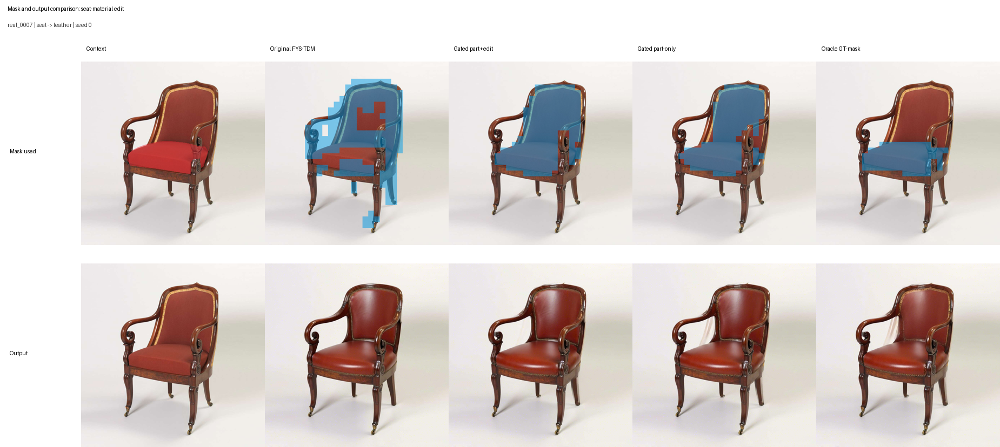

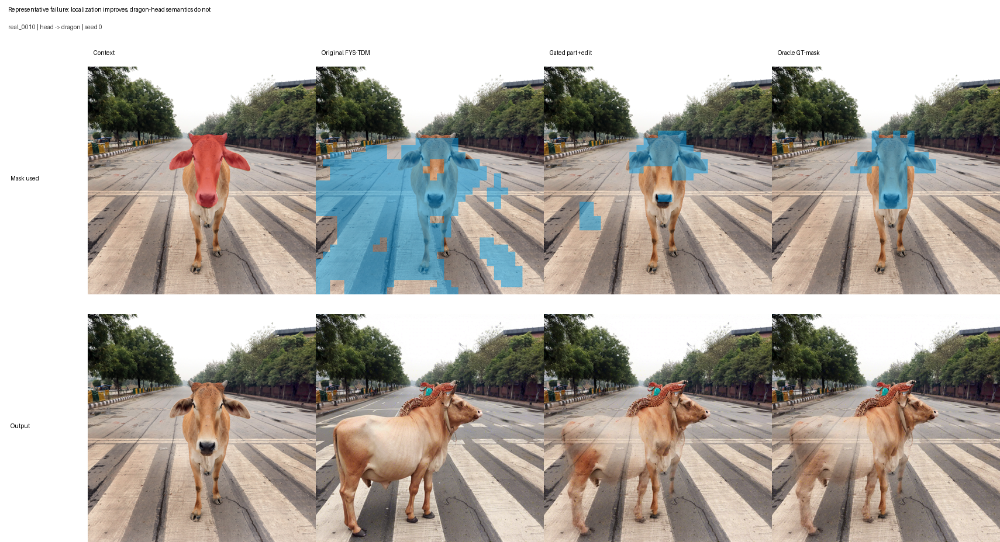

[PosixPath('/Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting/core/results/oracle_mask_eval/figures/mask_output_method_comparison.jpg'),
 PosixPath('/Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting/core/results/oracle_mask_eval/figures/cow_road_failure_analysis.jpg')]

In [9]:
MASK_FILES = {
    "original": "binary_tdm_mask.npy",
    "part_edit": "selected_binary_tdm_mask.npy",
    "part": "selected_binary_tdm_mask.npy",
    "oracle": "selected_injection_mask.npy",
}

def report_font(size):
    try:
        return ImageFont.truetype("DejaVuSans.ttf", size)
    except OSError:
        return ImageFont.load_default()

def resize_binary_mask(mask, size):
    return np.asarray(
        Image.fromarray((np.asarray(mask) > 0).astype(np.uint8) * 255).resize(
            size, Image.Resampling.NEAREST
        )
    ) > 0

def actual_injection_mask(method, case_uid, size):
    path = ROOTS[method] / case_uid / "seed_000" / "tdm" / MASK_FILES[method]
    return resize_binary_mask(np.load(path), size)

def build_mask_output_grid(case_uid, methods, title, output_name, panel_size=340):
    case = cases.loc[cases["case_uid"] == case_uid].iloc[0]
    image_size = Image.open(rp(case["source_image"])).size
    source = load_rgb(case["source_image"])
    gt = load_mask(case["gt_mask"], image_size)

    columns = [("Context", None)] + methods
    top_panels = [overlay(source, gt, color=(230, 45, 55), alpha=.5)]
    bottom_panels = [Image.fromarray(u8(source))]
    for _, method in methods:
        mask = actual_injection_mask(method, case_uid, image_size)
        top_panels.append(overlay(source, mask, color=(0, 155, 230), alpha=.5))
        output = load_rgb(latest_image(ROOTS[method] / case_uid / "seed_000"), image_size)
        bottom_panels.append(Image.fromarray(u8(output)))

    left_width = 150
    title_height = 74
    column_header_height = 40
    row_gap = 34
    panel = (panel_size, panel_size)
    width = left_width + len(columns) * panel_size
    height = title_height + column_header_height + 2 * panel_size + row_gap
    canvas = Image.new("RGB", (width, height), "white")
    draw = ImageDraw.Draw(canvas)
    title_font = report_font(21)
    label_font = report_font(17)
    row_font = report_font(18)

    draw.text((14, 10), title, fill="black", font=title_font)
    draw.text(
        (14, 40),
        f"{case_uid} | {case['part']} -> {case['edit']} | seed 0",
        fill=(55, 55, 55),
        font=label_font,
    )
    top_y = title_height + column_header_height
    bottom_y = top_y + panel_size + row_gap
    draw.text((18, top_y + panel_size // 2 - 10), "Mask used", fill="black", font=row_font)
    draw.text((18, bottom_y + panel_size // 2 - 10), "Output", fill="black", font=row_font)

    for index, ((label, _), mask_panel, output_panel) in enumerate(
        zip(columns, top_panels, bottom_panels)
    ):
        x = left_width + index * panel_size
        draw.text((x + 10, title_height + 10), label, fill="black", font=label_font)
        canvas.paste(mask_panel.resize(panel, Image.Resampling.BICUBIC), (x, top_y))
        canvas.paste(output_panel.resize(panel, Image.Resampling.BICUBIC), (x, bottom_y))

    path = FIGURE_DIR / output_name
    canvas.save(path, quality=96)
    return path, canvas

method_comparison_path, method_comparison_figure = build_mask_output_grid(
    case_uid="real_0007",
    methods=[
        ("Original FYS-TDM", "original"),
        ("Gated part+edit", "part_edit"),
        ("Gated part-only", "part"),
        ("Oracle GT-mask", "oracle"),
    ],
    title="Mask and output comparison: seat-material edit",
    output_name="mask_output_method_comparison.jpg",
)

failure_case_path, failure_case_figure = build_mask_output_grid(
    case_uid="real_0010",
    methods=[
        ("Original FYS-TDM", "original"),
        ("Gated part+edit", "part_edit"),
        ("Oracle GT-mask", "oracle"),
    ],
    title="Representative failure: localization improves, dragon-head semantics do not",
    output_name="cow_road_failure_analysis.jpg",
    panel_size=390,
)

display(method_comparison_figure)
display(failure_case_figure)
[method_comparison_path, failure_case_path]

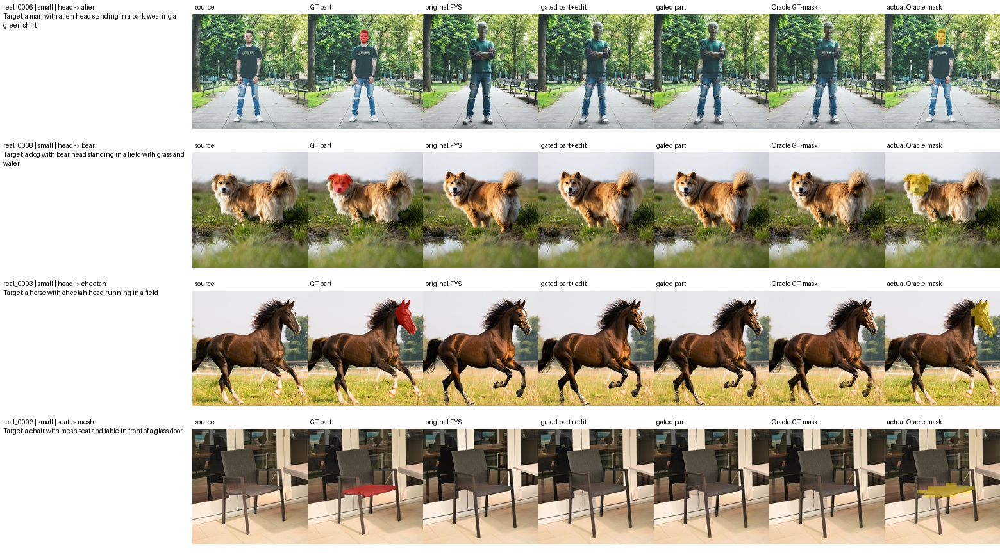

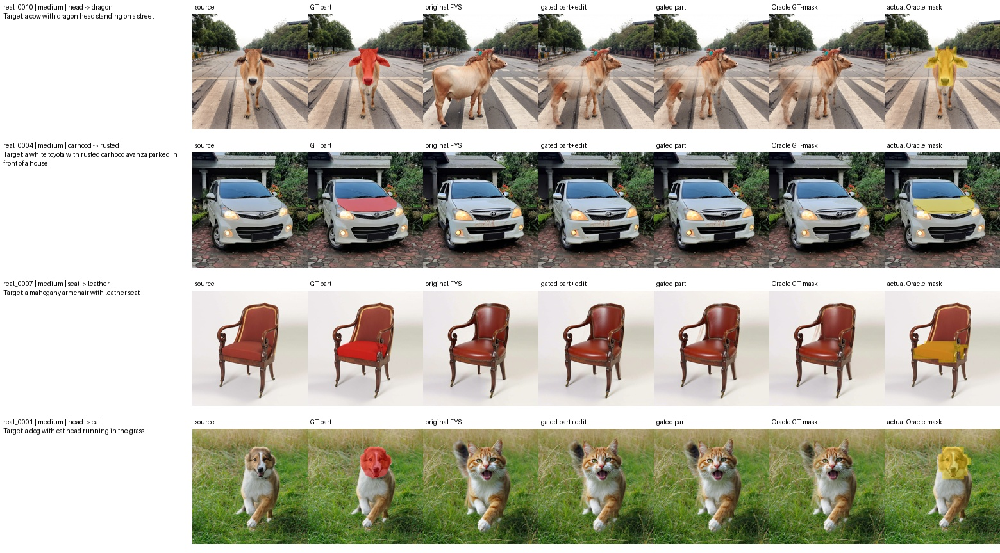

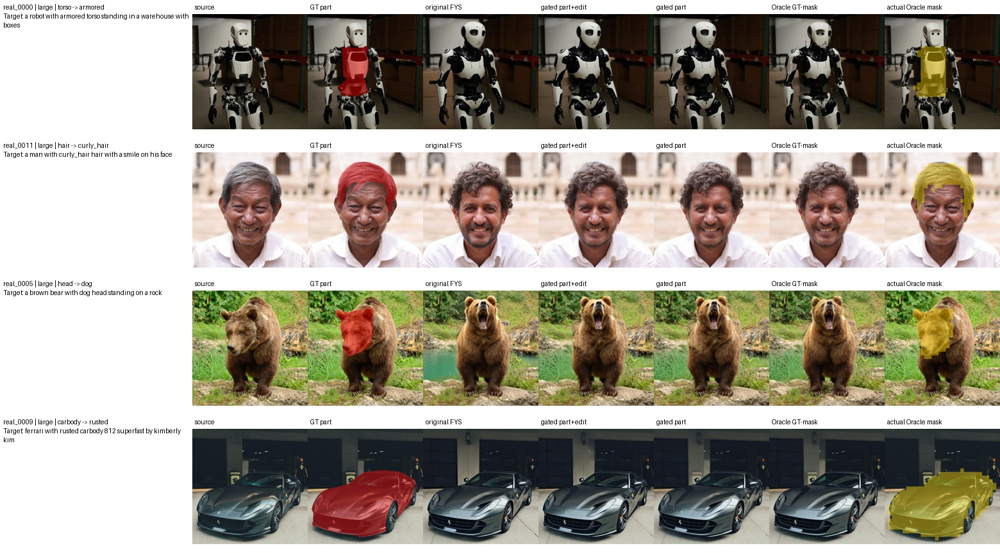

In [10]:
from IPython.display import display
for path in figure_paths:
    display(Image.open(path))

## 9. Manual Review

Automatic preservation metrics do not establish semantic edit success. Score Oracle with the same rubric as notebook 05: local edit success 0 absent, 1 partial, 2 clear; non-target preservation 0 major drift, 1 moderate drift, 2 mostly preserved. Existing non-empty ratings are preserved on rerun.

In [11]:
review_path = OUTPUT_DIR / "oracle_local_edit_review.csv"
review = cases[["case_uid","part","edit","part_size","target_prompt"]].copy()
review["oracle_local_edit_0_2"] = pd.NA
review["oracle_preservation_0_2"] = pd.NA
review["short_note"] = ""
if review_path.exists():
    old = pd.read_csv(review_path)
    rating_cols = ["case_uid","oracle_local_edit_0_2","oracle_preservation_0_2","short_note"]
    old = old[[x for x in rating_cols if x in old]]
    review = review.drop(columns=[x for x in rating_cols[1:] if x in review]).merge(old,on="case_uid",how="left")
review.to_csv(review_path,index=False)
review

,case_uid,part,edit,part_size,target_prompt,oracle_local_edit_0_2,oracle_preservation_0_2,short_note
0,real_0006,head,alien,small,a man with alien head standing in a park weari...,2,1,NaN
1,real_0008,head,bear,small,a dog with bear head standing in a field with ...,0,2,NaN
2,real_0003,head,cheetah,small,a horse with cheetah head running in a field,0,2,NaN
3,real_0002,seat,mesh,small,a chair with mesh seat and table in front of a...,2,2,NaN
4,real_0010,head,dragon,medium,a cow with dragon head standing on a street,0,1,NaN
5,real_0004,carhood,rusted,medium,a white toyota with rusted carhood avanza park...,0,1,NaN
6,real_0007,seat,leather,medium,a mahogany armchair with leather seat,1,1,NaN
7,real_0001,head,cat,medium,a dog with cat head running in the grass,2,1,NaN
8,real_0000,torso,armored,large,a robot with armored torso standing in a wareh...,1,2,NaN
9,real_0011,hair,curly_hair,large,a man with curly_hair hair with a smile on his...,2,1,NaN


In [12]:
scored_review = review.dropna(
    subset=["oracle_local_edit_0_2", "oracle_preservation_0_2"]
).copy()
if len(scored_review) != len(review):
    raise ValueError(f"Oracle manual review is incomplete: {len(scored_review)}/{len(review)} cases scored")

oracle_manual_summary = pd.DataFrame([
    {
        "scope": "overall",
        "cases": len(scored_review),
        "mean_local_edit_success": scored_review["oracle_local_edit_0_2"].mean(),
        "mean_non_target_preservation": scored_review["oracle_preservation_0_2"].mean(),
        "full_local_edit_cases": int((scored_review["oracle_local_edit_0_2"] == 2).sum()),
        "full_preservation_cases": int((scored_review["oracle_preservation_0_2"] == 2).sum()),
    }
])

size_summary = (
    scored_review.groupby("part_size", as_index=False)
    .agg(
        cases=("case_uid", "size"),
        mean_local_edit_success=("oracle_local_edit_0_2", "mean"),
        mean_non_target_preservation=("oracle_preservation_0_2", "mean"),
    )
)
size_summary.insert(0, "scope", "part_size=" + size_summary.pop("part_size"))
size_summary["full_local_edit_cases"] = pd.NA
size_summary["full_preservation_cases"] = pd.NA
oracle_manual_summary = pd.concat([oracle_manual_summary, size_summary], ignore_index=True)
oracle_manual_summary.to_csv(OUTPUT_DIR / "oracle_local_edit_review_summary.csv", index=False)
oracle_manual_summary.round(3)


,scope,cases,mean_local_edit_success,mean_non_target_preservation,full_local_edit_cases,full_preservation_cases
0,overall,12,0.917,1.417,4,5
1,part_size=large,4,1.000,1.500,<NA>,<NA>
2,part_size=medium,4,0.750,1.000,<NA>,<NA>
3,part_size=small,4,1.000,1.750,<NA>,<NA>


## 10. Combined Result Statement

In [13]:
o = summary[summary["method"]=="oracle_gt_mask"].iloc[0]
b = summary[summary["method"]=="original_fys"].iloc[0]
m = oracle_manual_summary[oracle_manual_summary["scope"]=="overall"].iloc[0]
print(f"Oracle automatic preservation: outside L1={o.outside_l1_aux:.3f}, PSNR={o.outside_psnr:.2f}, SSIM={o.outside_global_ssim:.3f}, LPIPS={o.outside_lpips:.3f}")
print(f"Delta vs original: L1={o.outside_l1_aux-b.outside_l1_aux:+.3f}, PSNR={o.outside_psnr-b.outside_psnr:+.2f}, SSIM={o.outside_global_ssim-b.outside_global_ssim:+.3f}, LPIPS={o.outside_lpips-b.outside_lpips:+.3f}")
print(f"Oracle manual review: local edit={m.mean_local_edit_success:.2f}/2, preservation={m.mean_non_target_preservation:.2f}/2, full edits={int(m.full_local_edit_cases)}/12, full preservation={int(m.full_preservation_cases)}/12")
print("Conclusion: projected GT masks improve automatic non-target preservation, but exact localization alone does not ensure semantic edit success under late KV injection.")


Oracle automatic preservation: outside L1=0.043, PSNR=22.95, SSIM=0.953, LPIPS=0.126
Delta vs original: L1=-0.013, PSNR=+2.59, SSIM=+0.034, LPIPS=-0.065
Oracle manual review: local edit=0.92/2, preservation=1.42/2, full edits=4/12, full preservation=5/12
Conclusion: projected GT masks improve automatic non-target preservation, but exact localization alone does not ensure semantic edit success under late KV injection.


## 11. Outputs

The notebook writes Oracle mask validation, per-case image metrics, the four-method summary, per-case deltas, completed manual-review ratings and summary, and three readable comparison sheets under `core/results/oracle_mask_eval`.